In [116]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore

In [117]:
# Read the raw file
with open('./data/NEW-DATA-1.T15.txt', 'r') as file:
    lines = file.readlines()

In [118]:
# Extract clean column names from the header
header = lines[0].strip()
column_names = []
for col in header.split():
    if ':' in col:
        column_names.append(col.split(':', 1)[1])  # Get part after colon


In [119]:
# Process data rows
data_rows = []
for line in lines[1:]:
    if line.strip():  # Skip empty lines
        values = line.strip().split()
        if len(values) == len(column_names):
            data_rows.append(values)

In [120]:
# Create DataFrame
df1 = pd.DataFrame(data_rows, columns=column_names)

# Display the DataFrame
print("Dataframe with clean column names:")
df1.head()



Dataframe with clean column names:


,Date,Time,Temperature_Comedor_Sensor,Temperature_Habitacion_Sensor,Weather_Temperature,CO2_Comedor_Sensor,CO2_Habitacion_Sensor,Humedad_Comedor_Sensor,Humedad_Habitacion_Sensor,Lighting_Comedor_Sensor,...,Meteo_Exterior_Sol_Oest,Meteo_Exterior_Sol_Est,Meteo_Exterior_Sol_Sud,Meteo_Exterior_Piranometro,Exterior_Entalpic_1,Exterior_Entalpic_2,Exterior_Entalpic_turbo,Temperature_Exterior_Sensor,Humedad_Exterior_Sensor,Day_Of_Week
0,13/03/2012,11:45,18.1875,17.8275,0,216.56,221.92,39.9125,42.415,81.665,...,9690.24,12604.2,95436.8,758.88,0,0,0,18.115,48.375,2
1,13/03/2012,12:00,18.4633,18.1207,6.8,219.947,220.363,39.9267,42.2453,81.7413,...,11022,10787.2,95436.8,762.069,0,0,0,18.4147,47.808,2
2,13/03/2012,12:15,18.7673,18.4367,17,219.403,218.933,39.772,42.2267,81.424,...,13960.5,9669.63,95398.6,766.251,0,0,0,18.8533,47.432,2
3,13/03/2012,12:30,19.0727,18.7513,18,218.613,217.045,39.776,42.0987,81.5013,...,18511.2,9648.13,95360.3,766.037,0,0,0,19.2907,47.024,2
4,13/03/2012,12:45,19.3721,19.0414,20,217.714,216.08,39.7757,42.0686,81.4657,...,26349,9208.32,95354.9,762.743,0,0,0,19.74,45.4743,2


In [121]:
print(f"\nNumber of columns: {len(df1.columns)}")


Number of columns: 24


In [122]:
print(f"Number of rows: {len(df1)}")

Number of rows: 2764


In [123]:
print(f"Number of unique values: {df1.nunique()}\n")

Number of unique values: Date                               30
Time                               96
Temperature_Comedor_Sensor       2351
Temperature_Habitacion_Sensor    2316
Weather_Temperature               243
CO2_Comedor_Sensor               1661
CO2_Habitacion_Sensor            1669
Humedad_Comedor_Sensor           2404
Humedad_Habitacion_Sensor        2403
Lighting_Comedor_Sensor           785
Lighting_Habitacion_Sensor       1205
Precipitacion                      15
Meteo_Exterior_Crepusculo         491
Meteo_Exterior_Viento            1596
Meteo_Exterior_Sol_Oest          1304
Meteo_Exterior_Sol_Est           1211
Meteo_Exterior_Sol_Sud           1233
Meteo_Exterior_Piranometro       1459
Exterior_Entalpic_1                 1
Exterior_Entalpic_2                 1
Exterior_Entalpic_turbo             1
Temperature_Exterior_Sensor      2507
Humedad_Exterior_Sensor          2581
Day_Of_Week                        14
dtype: int64



# Exploratory Data Analysis (EDA)
In this section, we perform EDA to understand the dataset better. This includes:
- Checking for missing values
- Visualizing distributions of key features
- Identifying correlations between features
- Detecting outliers

In [124]:
# Check for missing values
missing_values = df1.isnull().sum()
print("Missing values in each column:")
print(missing_values)

Missing values in each column:
Date                             0
Time                             0
Temperature_Comedor_Sensor       0
Temperature_Habitacion_Sensor    0
Weather_Temperature              0
CO2_Comedor_Sensor               0
CO2_Habitacion_Sensor            0
Humedad_Comedor_Sensor           0
Humedad_Habitacion_Sensor        0
Lighting_Comedor_Sensor          0
Lighting_Habitacion_Sensor       0
Precipitacion                    0
Meteo_Exterior_Crepusculo        0
Meteo_Exterior_Viento            0
Meteo_Exterior_Sol_Oest          0
Meteo_Exterior_Sol_Est           0
Meteo_Exterior_Sol_Sud           0
Meteo_Exterior_Piranometro       0
Exterior_Entalpic_1              0
Exterior_Entalpic_2              0
Exterior_Entalpic_turbo          0
Temperature_Exterior_Sensor      0
Humedad_Exterior_Sensor          0
Day_Of_Week                      0
dtype: int64


In [125]:
df1['Date'] = pd.to_datetime(df1['Date'], format='%d/%m/%Y')
df1['Time'] = pd.to_datetime(df1['Time'], format='%H:%M')
df1['Hour'] = df1['Time'].dt.hour

In [126]:
# Add Month as a feature
df1['Month'] = df1['Date'].dt.month

In [127]:
# Check data types of the columns
print(df1.dtypes)

Date                             datetime64[ns]
Time                             datetime64[ns]
Temperature_Comedor_Sensor               object
Temperature_Habitacion_Sensor            object
Weather_Temperature                      object
CO2_Comedor_Sensor                       object
CO2_Habitacion_Sensor                    object
Humedad_Comedor_Sensor                   object
Humedad_Habitacion_Sensor                object
Lighting_Comedor_Sensor                  object
Lighting_Habitacion_Sensor               object
Precipitacion                            object
Meteo_Exterior_Crepusculo                object
Meteo_Exterior_Viento                    object
Meteo_Exterior_Sol_Oest                  object
Meteo_Exterior_Sol_Est                   object
Meteo_Exterior_Sol_Sud                   object
Meteo_Exterior_Piranometro               object
Exterior_Entalpic_1                      object
Exterior_Entalpic_2                      object
Exterior_Entalpic_turbo                 

In [128]:
# Convert columns to numeric where applicable
for col in df1.columns:
    if df1[col].dtype == 'object':  # Check if column is of type object
        df1[col] = pd.to_numeric(df1[col], errors='coerce')  # Convert to numeric, coerce errors to NaN

# Drop columns with all NaN values (if conversion failed for all rows in a column)
df1 = df1.dropna(axis=1, how='all')

# Check for missing values
missing_values = df1.isnull().sum()
print("Missing values in each column:")
print(missing_values)



Missing values in each column:
Date                             0
Time                             0
Temperature_Comedor_Sensor       0
Temperature_Habitacion_Sensor    0
Weather_Temperature              0
CO2_Comedor_Sensor               0
CO2_Habitacion_Sensor            0
Humedad_Comedor_Sensor           0
Humedad_Habitacion_Sensor        0
Lighting_Comedor_Sensor          0
Lighting_Habitacion_Sensor       0
Precipitacion                    0
Meteo_Exterior_Crepusculo        0
Meteo_Exterior_Viento            0
Meteo_Exterior_Sol_Oest          0
Meteo_Exterior_Sol_Est           0
Meteo_Exterior_Sol_Sud           0
Meteo_Exterior_Piranometro       0
Exterior_Entalpic_1              0
Exterior_Entalpic_2              0
Exterior_Entalpic_turbo          0
Temperature_Exterior_Sensor      0
Humedad_Exterior_Sensor          0
Day_Of_Week                      0
Hour                             0
Month                            0
dtype: int64


In [129]:
df1.dtypes

Date                             datetime64[ns]
Time                             datetime64[ns]
Temperature_Comedor_Sensor              float64
Temperature_Habitacion_Sensor           float64
Weather_Temperature                     float64
CO2_Comedor_Sensor                      float64
CO2_Habitacion_Sensor                   float64
Humedad_Comedor_Sensor                  float64
Humedad_Habitacion_Sensor               float64
Lighting_Comedor_Sensor                 float64
Lighting_Habitacion_Sensor              float64
Precipitacion                           float64
Meteo_Exterior_Crepusculo               float64
Meteo_Exterior_Viento                   float64
Meteo_Exterior_Sol_Oest                 float64
Meteo_Exterior_Sol_Est                  float64
Meteo_Exterior_Sol_Sud                  float64
Meteo_Exterior_Piranometro              float64
Exterior_Entalpic_1                       int64
Exterior_Entalpic_2                       int64
Exterior_Entalpic_turbo                 

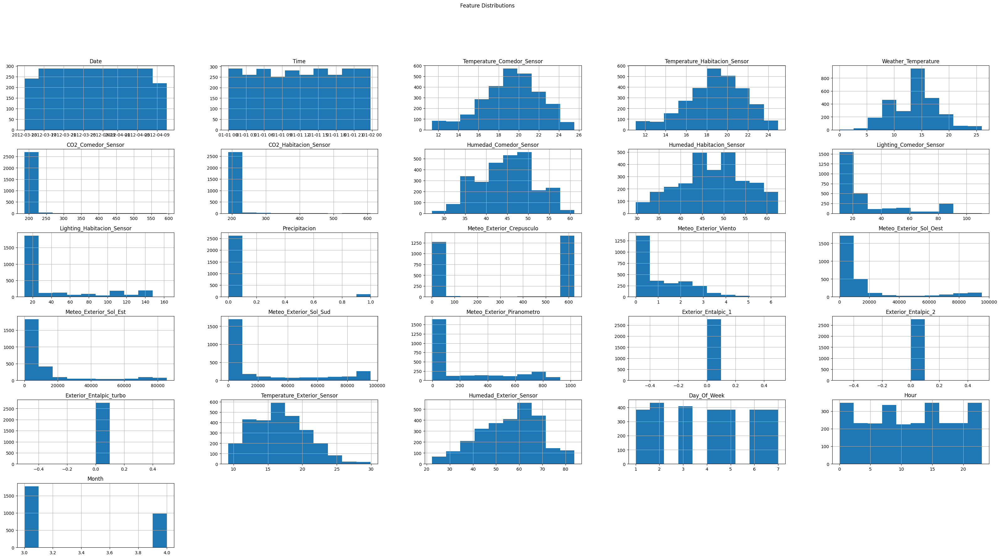

In [130]:
# Visualize distributions of numerical features
if not df1.select_dtypes(include=['number']).empty:
    df1.hist(figsize=(40, 20), )
    plt.suptitle('Feature Distributions')
    plt.show()
else:
    print("No numerical columns available for histogram plotting.")

In [131]:
# # Correlation heatmap
# plt.figure(figsize=(10, 8))
# sns.heatmap(df1.corr(), annot=True, cmap='coolwarm')
# plt.title('Feature Correlation Heatmap')
# plt.show()

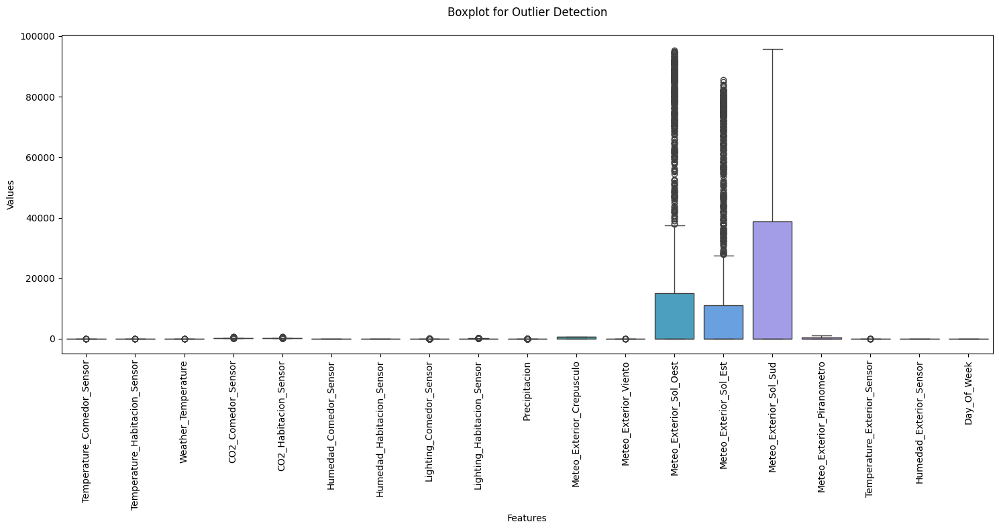

In [132]:

# Create boxplots for outlier detection
plt.figure(figsize=(15, 8))

# Select only numeric columns
numeric_df1 = df1.select_dtypes(include=['float'])

sns.boxplot(data=numeric_df1)

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Add labels and title
plt.title('Boxplot for Outlier Detection', pad=20)
plt.xlabel('Features')
plt.ylabel('Values')

# Adjust layout to prevent label cutoff
plt.tight_layout()

plt.show()


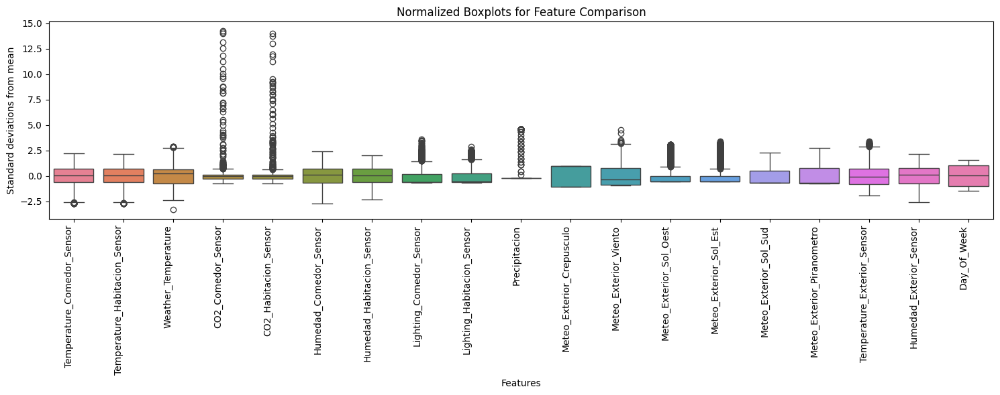

In [133]:
# Create separate boxplots for different scales
plt.figure(figsize=(15, 6))

# Select numeric columns and normalize them for better comparison
numeric_df1 = df1.select_dtypes(include=["float"])
normalized_df1 = (numeric_df1 - numeric_df1.mean()) / numeric_df1.std()

# Create boxplot with normalized data
sns.boxplot(data=normalized_df1)

# Formatting
plt.xticks(rotation=90, ha='right')
plt.title('Normalized Boxplots for Feature Comparison')
plt.xlabel('Features')
plt.ylabel('Standard deviations from mean')

# Adjust layout
plt.tight_layout()
plt.show()

In [134]:
# Print summary statistics for each variable
print("\nSummary statistics:")
print(numeric_df1.describe())


Summary statistics:
       Temperature_Comedor_Sensor  Temperature_Habitacion_Sensor  \
count                 2764.000000                    2764.000000   
mean                    19.199722                      18.824852   
std                      2.853315                       2.821178   
min                     11.352000                      11.076000   
25%                     17.450800                      17.060350   
50%                     19.373650                      19.021000   
75%                     21.229975                      20.828700   
max                     25.540000                      24.944000   

       Weather_Temperature  CO2_Comedor_Sensor  CO2_Habitacion_Sensor  \
count          2764.000000         2764.000000            2764.000000   
mean             13.897396          208.479123             211.065844   
std               4.171991           27.032686              28.469144   
min               0.000000          187.339000             188.907000   
2

In [135]:
# import pandas as pd
# import numpy as np
# from scipy.stats import zscore

# # === Step 1: Log transformation for highly skewed features ===
# log_transform_features = [
#     'Meteo_Exterior_Sol_Sud',
#     'Meteo_Exterior_Sol_Est',
#     'Meteo_Exterior_Sol_Oest',
#     'Meteo_Exterior_Piranometro'
# ]

# # Avoid log(0) or negative values
# for feature in log_transform_features:
#       df1[f'log_{feature}'] = np.log1p(df1[feature].clip(lower=0))   # log1p(x) = log(1+x), safe for 0 values

# # === Step 2: Z-score filtering for moderate outliers ===
# zscore_features = [
#     'CO2_Comedor_Sensor',
#     'CO2_Habitacion_Sensor',
    

# ]

# # Calculate z-scores and filter
# for feature in zscore_features:
#     df1 = df1[(np.abs(zscore(df1[feature])) < 3)]

# # === Optional Step 3: IQR-based filtering for all features ===
# def iqr_filter(df1, features):
#     for col in features:
#         Q1 = df1[col].quantile(0.25)
#         Q3 = df1[col].quantile(0.75)
#         IQR = Q3 - Q1
#         lower = Q1 - 1.5 * IQR
#         upper = Q3 + 1.5 * IQR
#         df1 = df1[(df1[col] >= lower) & (df1[col] <= upper)]
#     return df1

# # Uncomment below to apply IQR filter to selected or all numerical features
# df1 = iqr_filter(df1, df1.select_dtypes(include=np.number).columns.tolist())


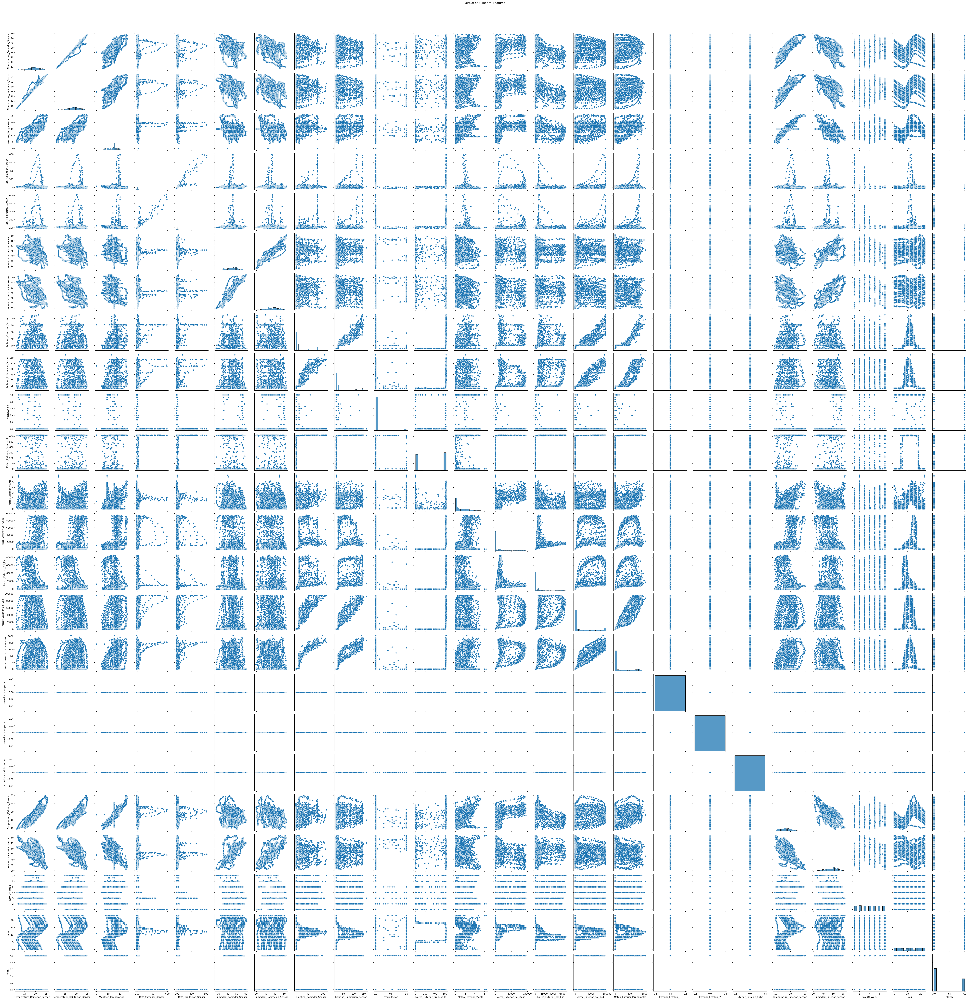

In [136]:
# Pairplot to visualize relationships between features
sns.pairplot(df1.select_dtypes(include=np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()


In this section, we perform advanced EDA techniques to gain deeper insights into the dataset.

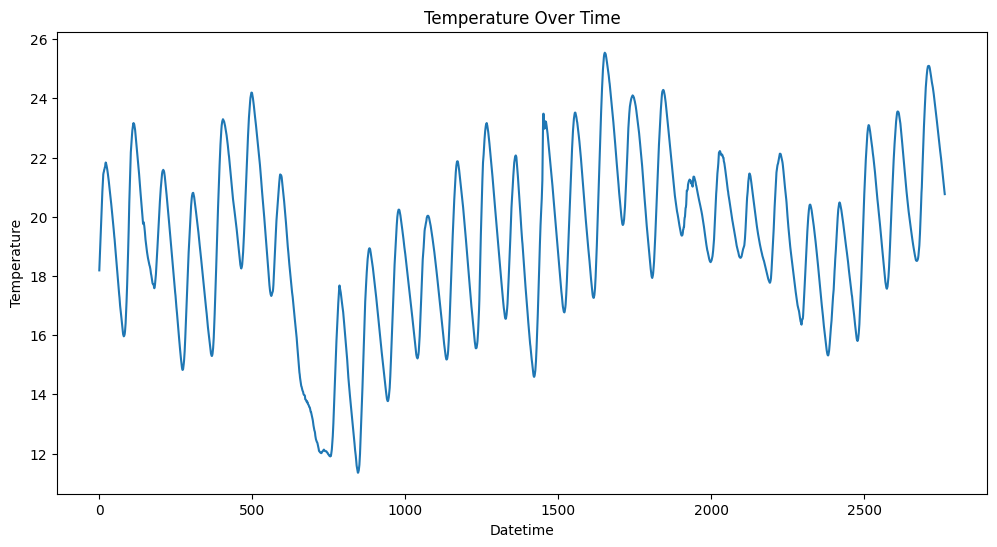

In [137]:
# Time Series Analysis
df1['Temperature_Comedor_Sensor'] = pd.to_numeric(df1['Temperature_Comedor_Sensor'], errors='coerce')
df1['Temperature_Comedor_Sensor'].plot(figsize=(12, 6))
plt.title('Temperature Over Time')
plt.xlabel('Datetime')
plt.ylabel('Temperature')
plt.show()

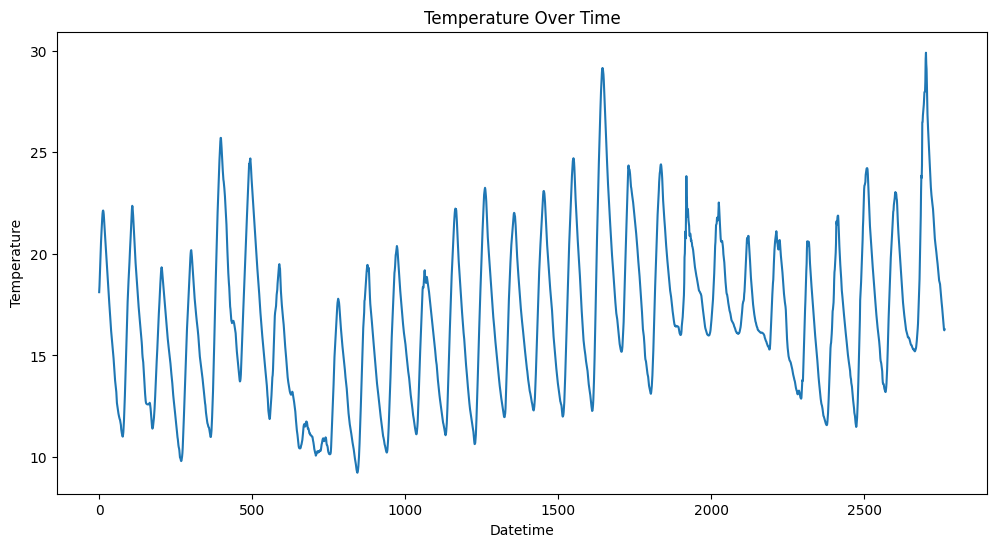

In [138]:
df1['Temperature_Exterior_Sensor'] = pd.to_numeric(df1['Temperature_Exterior_Sensor'], errors='coerce')
df1['Temperature_Exterior_Sensor'].plot(figsize=(12, 6))
plt.title('Temperature Over Time')
plt.xlabel('Datetime')
plt.ylabel('Temperature')
plt.show()

Day_Of_Week
2.00000    429
3.00000    406
4.00000    380
1.00000    380
6.00000    380
5.00000    380
7.00000    380
2.06667      5
4.06667      4
3.06667      4
6.06667      4
5.06667      4
6.60000      4
1.06667      4
Name: count, dtype: int64


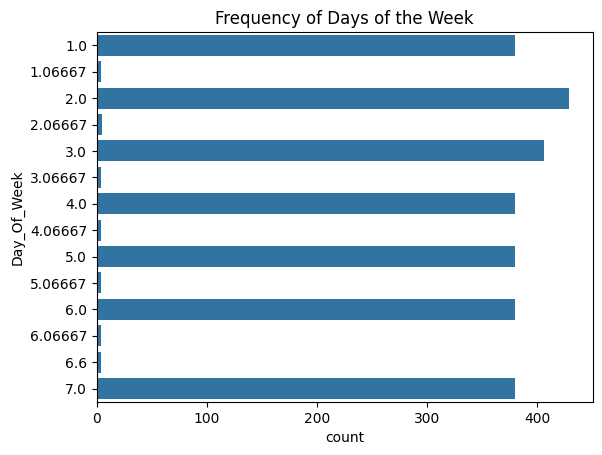

In [139]:
# Categorical Data Analysis
print(df1['Day_Of_Week'].value_counts())
sns.countplot(y='Day_Of_Week', data=df1 )
plt.title('Frequency of Days of the Week')
plt.show()

Day_Of_Week
1.00000    20.035636
1.06667    19.614825
2.00000    19.089801
2.06667    18.475600
3.00000    18.377144
3.06667    18.250525
4.00000    18.715573
4.06667    18.583150
5.00000    18.746681
5.06667    19.247675
6.00000    19.352329
6.06667    19.615325
6.60000    20.506350
7.00000    20.154353
Name: Temperature_Comedor_Sensor, dtype: float64


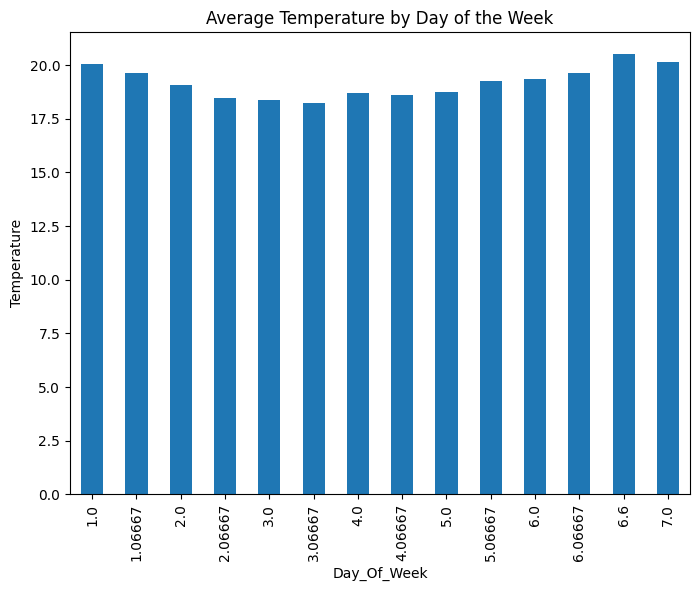

In [140]:
# Group-by Analysis
avg_temp_by_day = df1.groupby('Day_Of_Week')['Temperature_Comedor_Sensor'].mean()
print(avg_temp_by_day)
avg_temp_by_day.plot(kind='bar', figsize=(8, 6))
plt.title('Average Temperature by Day of the Week')
plt.ylabel('Temperature')
plt.show()

In [141]:
# Anomaly Detection
df1['Temperature_Zscore'] = zscore(df1['Temperature_Comedor_Sensor'])
anomalies = df1[(df1['Temperature_Zscore'] > 3) | (df1['Temperature_Zscore'] < -3)]
print('Anomalies:')
print(anomalies)

Anomalies:
Empty DataFrame
Columns: [Date, Time, Temperature_Comedor_Sensor, Temperature_Habitacion_Sensor, Weather_Temperature, CO2_Comedor_Sensor, CO2_Habitacion_Sensor, Humedad_Comedor_Sensor, Humedad_Habitacion_Sensor, Lighting_Comedor_Sensor, Lighting_Habitacion_Sensor, Precipitacion, Meteo_Exterior_Crepusculo, Meteo_Exterior_Viento, Meteo_Exterior_Sol_Oest, Meteo_Exterior_Sol_Est, Meteo_Exterior_Sol_Sud, Meteo_Exterior_Piranometro, Exterior_Entalpic_1, Exterior_Entalpic_2, Exterior_Entalpic_turbo, Temperature_Exterior_Sensor, Humedad_Exterior_Sensor, Day_Of_Week, Hour, Month, Temperature_Zscore]
Index: []

[0 rows x 27 columns]


Season
Spring    19.199722
Name: Temperature_Comedor_Sensor, dtype: float64


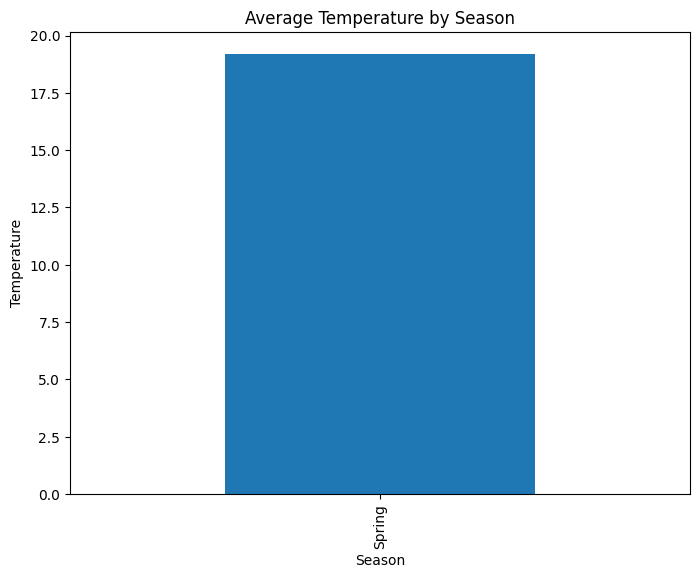

In [142]:
# Seasonal Analysis
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

df1['Season'] = df1['Month'].apply(get_season)
avg_temp_by_season = df1.groupby('Season')['Temperature_Comedor_Sensor'].mean()
print(avg_temp_by_season)
avg_temp_by_season.plot(kind='bar', figsize=(8, 6))
plt.title('Average Temperature by Season')
plt.ylabel('Temperature')
plt.show()

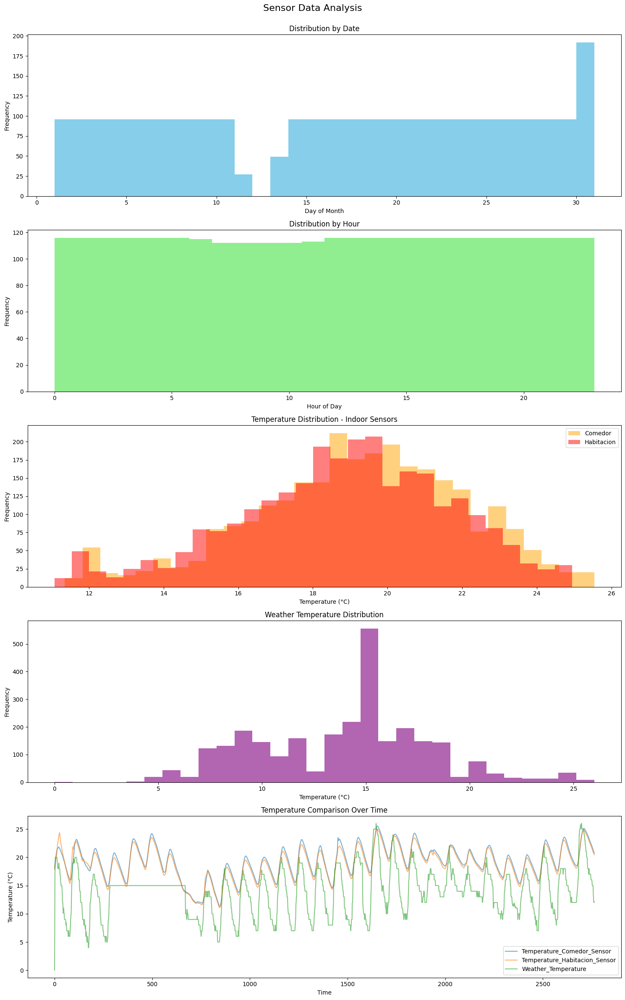

In [143]:
# Create a figure with subplots, properly spaced
fig, axs = plt.subplots(5, 1, figsize=(15, 25))
fig.suptitle('Sensor Data Analysis', fontsize=16, y=0.95)

# Plot 1: Date Distribution
axs[0].hist(df1['Date'].dt.day, bins=30, color='skyblue')
axs[0].set_title('Distribution by Date')
axs[0].set_xlabel('Day of Month')
axs[0].set_ylabel('Frequency')

# Plot 2: Time Distribution
axs[1].hist(df1['Hour'], bins=24, color='lightgreen')
axs[1].set_title('Distribution by Hour')
axs[1].set_xlabel('Hour of Day')
axs[1].set_ylabel('Frequency')

# Plot 3: Temperature Distributions
axs[2].hist(df1['Temperature_Comedor_Sensor'], bins=30, alpha=0.5, label='Comedor', color='orange')
axs[2].hist(df1['Temperature_Habitacion_Sensor'], bins=30, alpha=0.5, label='Habitacion', color='red')
axs[2].set_title('Temperature Distribution - Indoor Sensors')
axs[2].set_xlabel('Temperature (°C)')
axs[2].set_ylabel('Frequency')
axs[2].legend()

# Plot 4: Weather Temperature
axs[3].hist(df1['Weather_Temperature'], bins=30, color='purple', alpha=0.6)
axs[3].set_title('Weather Temperature Distribution')
axs[3].set_xlabel('Temperature (°C)')
axs[3].set_ylabel('Frequency')

# Plot 5: Temperature Comparison
df1.plot(y=['Temperature_Comedor_Sensor', 'Temperature_Habitacion_Sensor', 'Weather_Temperature'],
        ax=axs[4], alpha=0.6)
axs[4].set_title('Temperature Comparison Over Time')
axs[4].set_xlabel('Time')
axs[4].set_ylabel('Temperature (°C)')

# Adjust layout to prevent overlap
plt.tight_layout( rect=[0, 0, 1, 0.95])  # Leave space for the main title
plt.show()

ARIMA Model Summary:
                                   SARIMAX Results                                    
Dep. Variable:     Temperature_Comedor_Sensor   No. Observations:                 2764
Model:                         ARIMA(5, 1, 0)   Log Likelihood                5419.020
Date:                        Fri, 09 May 2025   AIC                         -10826.041
Time:                                14:57:06   BIC                         -10790.496
Sample:                            03-13-2012   HQIC                        -10813.202
                                 - 04-11-2012                                         
Covariance Type:                          opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9923      0.006    156.343      0.000       0.980       1.005
ar.L2         -0.0014      0.008     -0.167   

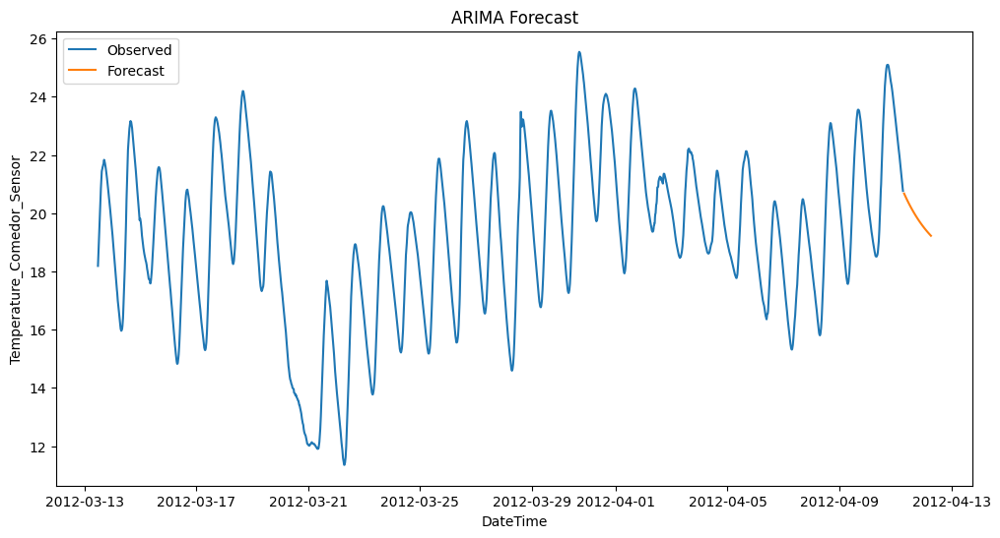

In [144]:
# Additional imports for time series forecasting
import statsmodels.api as sm
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import pandas as pd

# Prepare time series data for statsmodels and darts
df1['DateTime'] = pd.to_datetime(df1['Date'].dt.strftime('%Y-%m-%d') + ' ' + df1['Time'].dt.strftime('%H:%M:%S'))
df1 = df1.sort_values('DateTime')

ts_data = df1.set_index('DateTime')['Temperature_Comedor_Sensor'].astype(float)
ts_data = ts_data.interpolate(method='time')
ts_data = ts_data.asfreq('15T')  # Set explicit frequency to 15 minutes


# Statsmodels ARIMA model
arima_order = (5,1,0)  # example order, can be tuned
arima_model = sm.tsa.ARIMA(ts_data, order=arima_order)
arima_result = arima_model.fit()

# Forecast next 24 periods (assuming hourly data)
forecast_steps = 24
arima_forecast = arima_result.forecast(steps=forecast_steps)

print("ARIMA Model Summary:")
print(arima_result.summary())

# Plot ARIMA forecast
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
plt.plot(ts_data.index, ts_data, label='Observed')
plt.plot(pd.date_range(ts_data.index[-1], periods=forecast_steps+1, freq='h')[1:], arima_forecast, label='Forecast')

plt.title('ARIMA Forecast')
plt.xlabel('DateTime')
plt.ylabel('Temperature_Comedor_Sensor')
plt.legend()
plt.show()


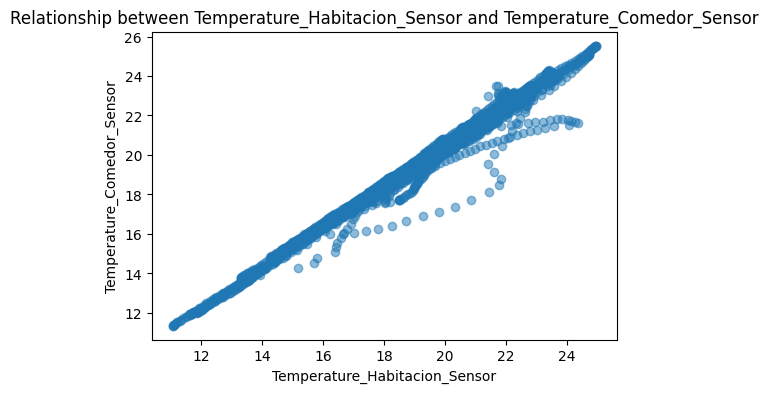

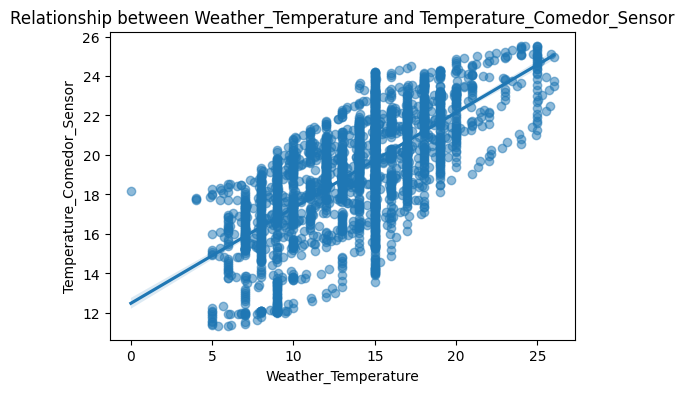

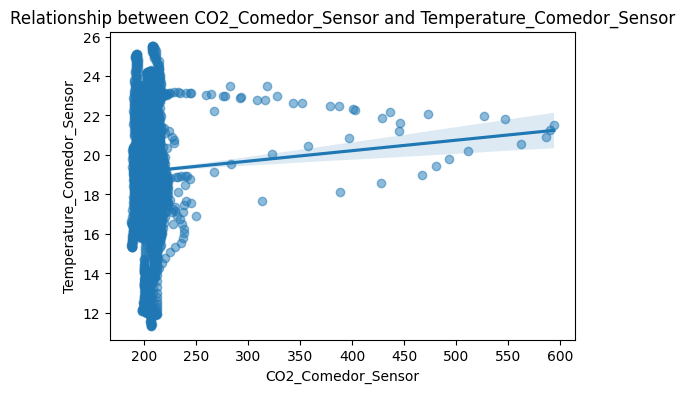

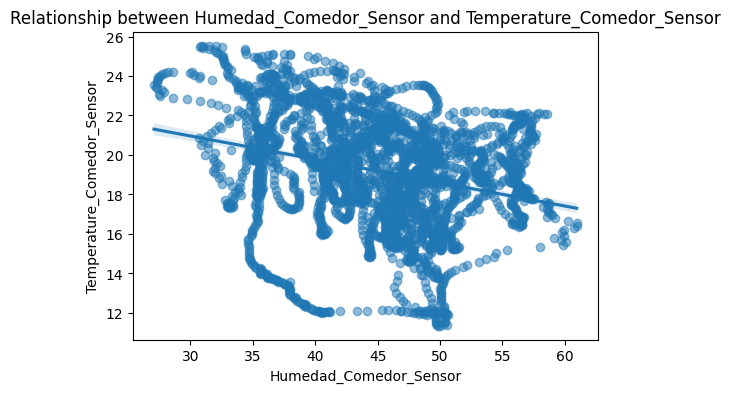

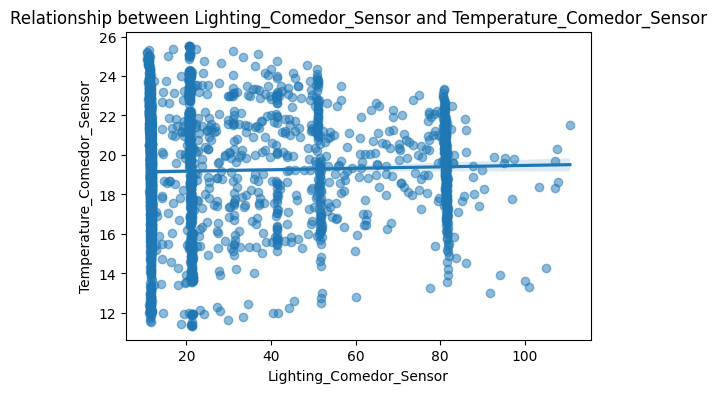

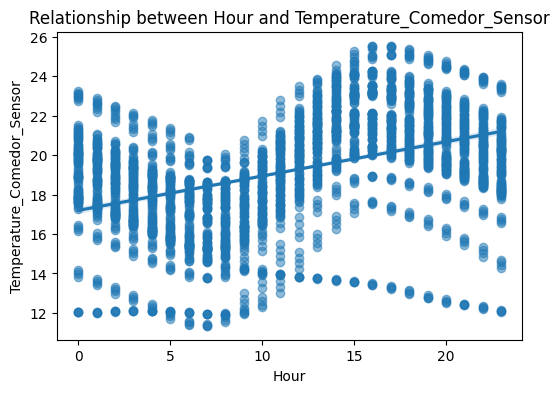

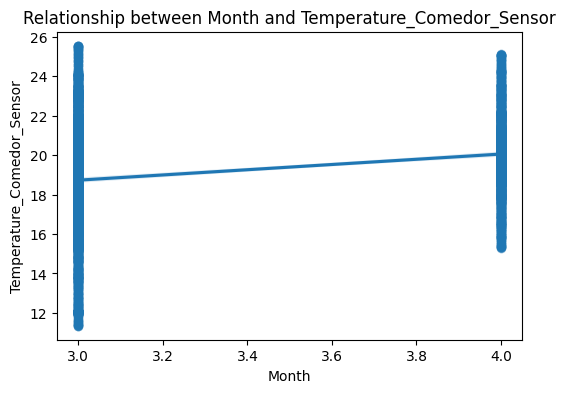

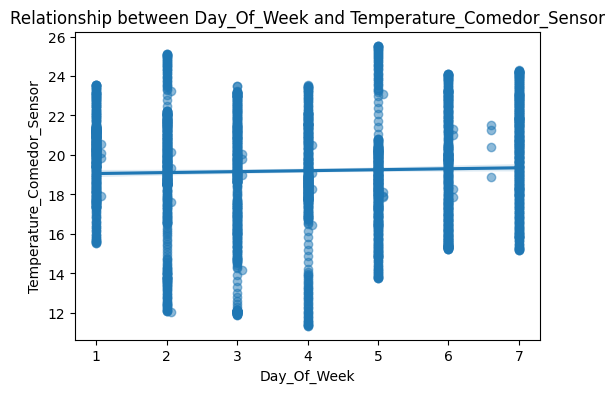

In [145]:
import matplotlib.pyplot as plt
import seaborn as sns

features = ['Temperature_Habitacion_Sensor', 'Weather_Temperature', 'CO2_Comedor_Sensor', 'Humedad_Comedor_Sensor', 'Lighting_Comedor_Sensor', 'Hour', 'Month', 'Day_Of_Week']
target = 'Temperature_Comedor_Sensor'

for feature in features:
    plt.figure(figsize=(6,4))
    sns.regplot(x=df1[feature], y=df1[target], scatter_kws={'alpha':0.5})
    plt.title(f'Relationship between {feature} and {target}')
    plt.show()


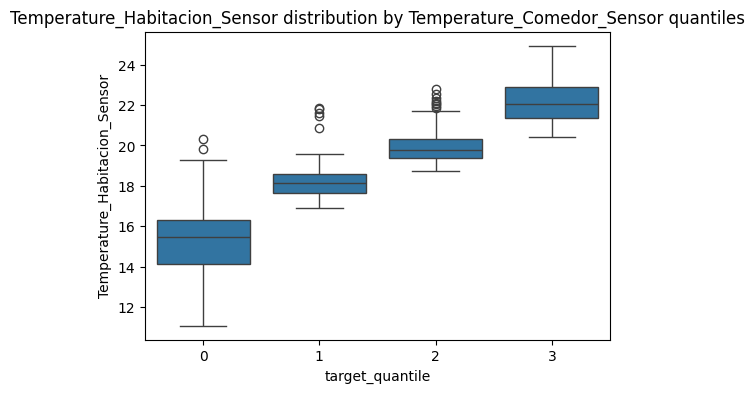

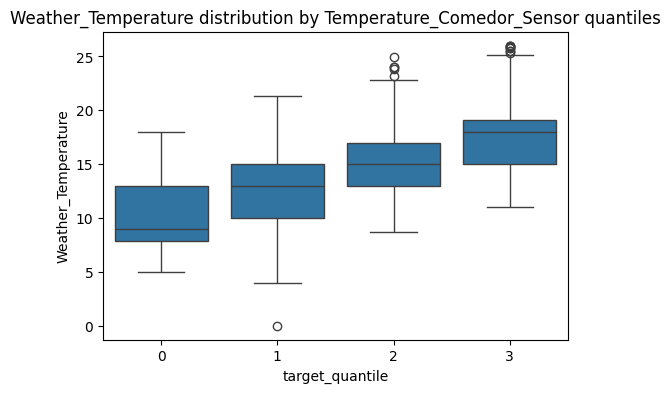

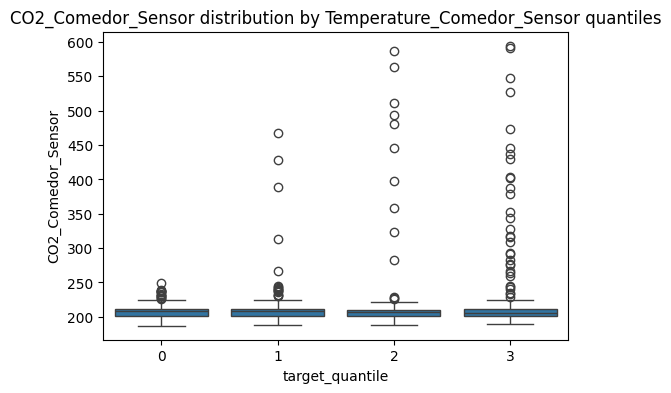

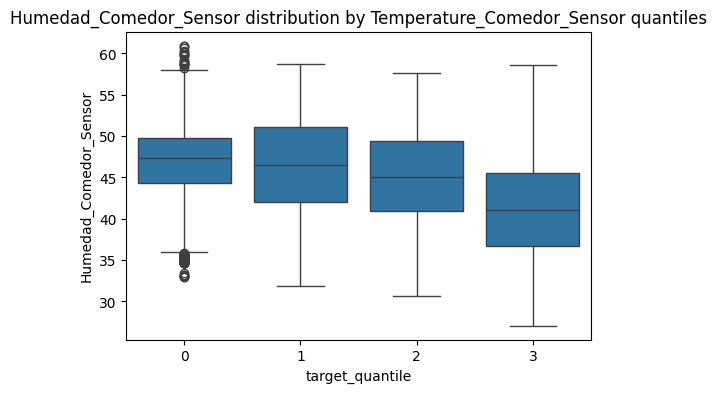

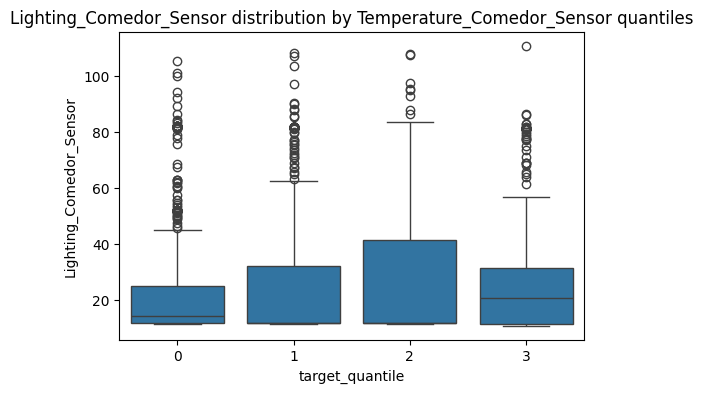

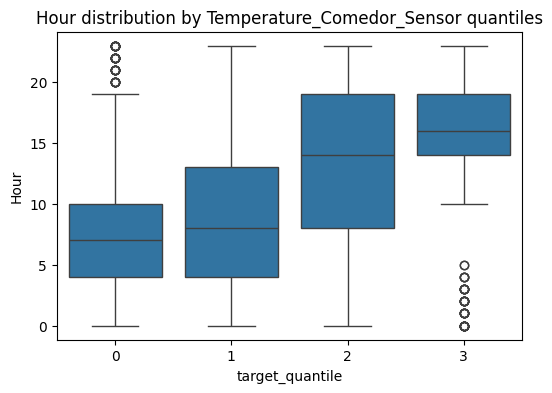

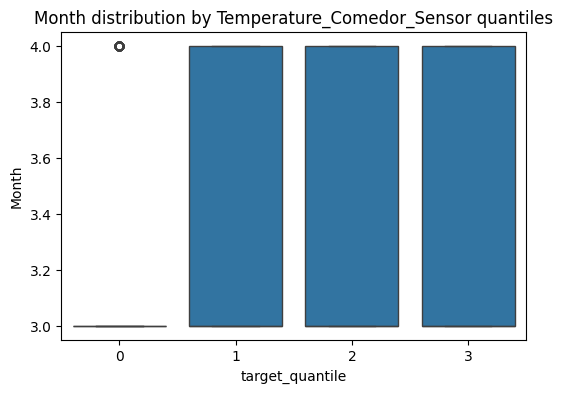

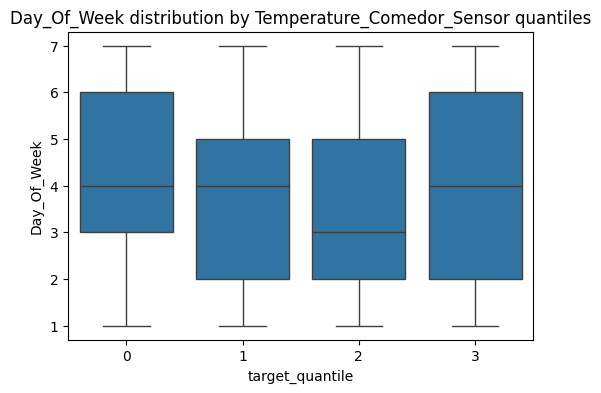

In [146]:
df1['target_quantile'] = pd.qcut(df1[target], q=4, labels=False)

for feature in features:
    plt.figure(figsize=(6,4))
    sns.boxplot(x='target_quantile', y=feature, data=df1)
    plt.title(f'{feature} distribution by {target} quantiles')
    plt.show()


In [147]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd

X = df1[features].select_dtypes(include=[float, int]).dropna()
vif_data = pd.DataFrame()
vif_data['feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]
print(vif_data)


                         feature         VIF
0  Temperature_Habitacion_Sensor  106.065070
1            Weather_Temperature   36.960427
2             CO2_Comedor_Sensor   49.436877
3         Humedad_Comedor_Sensor   51.972333
4        Lighting_Comedor_Sensor    3.594892
5                           Hour    5.149620
6                          Month   63.008730
7                    Day_Of_Week    4.860632


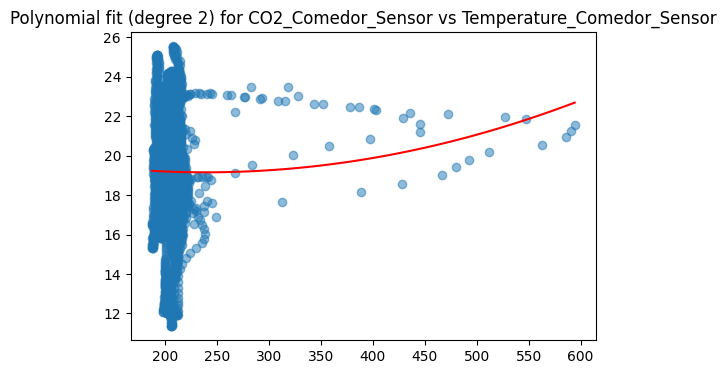

In [148]:
import numpy as np
from numpy.polynomial.polynomial import Polynomial

feature = 'CO2_Comedor_Sensor'
x = df1[feature].dropna()
y = df1.loc[x.index, target]

p = Polynomial.fit(x, y, 2)
plt.figure(figsize=(6,4))
plt.scatter(x, y, alpha=0.5)
plt.plot(*p.linspace(), color='red')
plt.title(f'Polynomial fit (degree 2) for {feature} vs {target}')
plt.show()


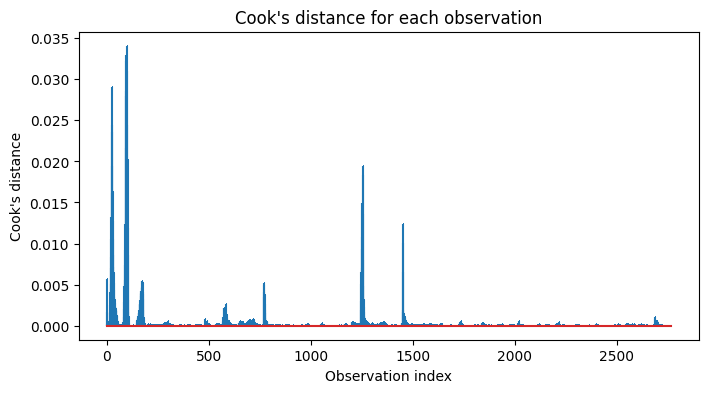

In [149]:
import statsmodels.api as sm

X = sm.add_constant(X)
model = sm.OLS(y, X).fit()
influence = model.get_influence()
(c, p) = influence.cooks_distance

plt.figure(figsize=(8,4))
plt.stem(np.arange(len(c)), c, markerfmt=",")
plt.title("Cook's distance for each observation")
plt.xlabel('Observation index')
plt.ylabel("Cook's distance")
plt.show()


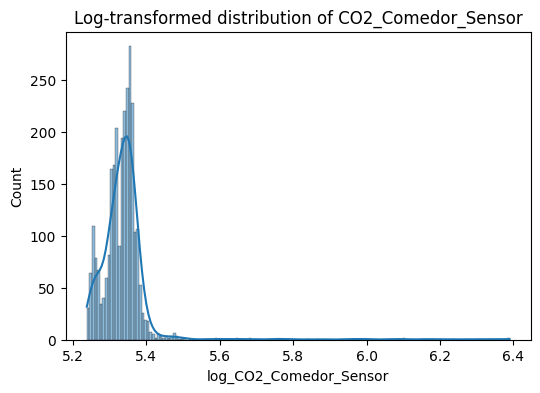

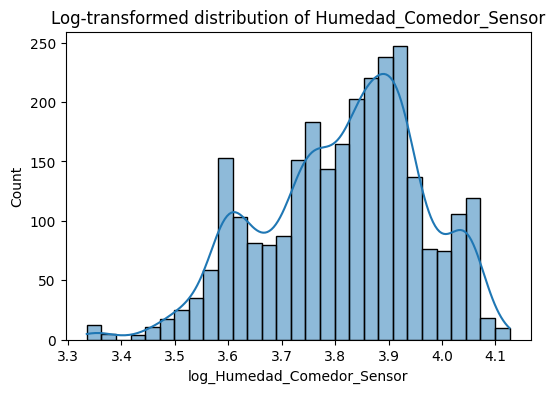

In [150]:
import numpy as np

skewed_features = ['CO2_Comedor_Sensor', 'Humedad_Comedor_Sensor']
for feature in skewed_features:
    df1[f'log_{feature}'] = np.log1p(df1[feature])
    plt.figure(figsize=(6,4))
    sns.histplot(df1[f'log_{feature}'].dropna(), kde=True)
    plt.title(f'Log-transformed distribution of {feature}')
    plt.show()


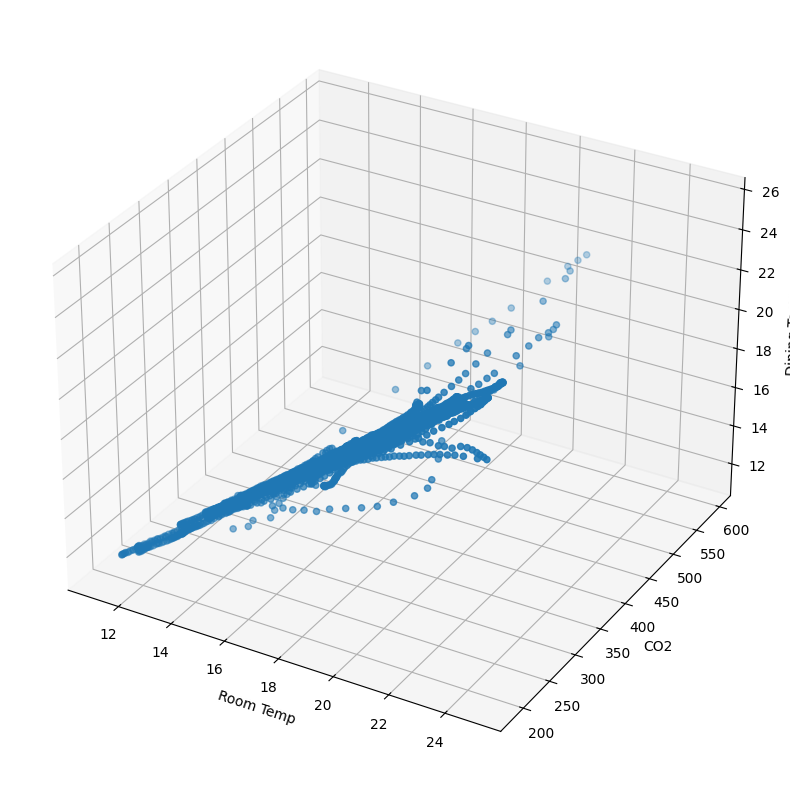

In [151]:
# 3D plot (requires matplotlib 3D axes)
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df1['Temperature_Habitacion_Sensor'], 
           df1['CO2_Comedor_Sensor'], 
           df1['Temperature_Comedor_Sensor'])
ax.set_xlabel('Room Temp')
ax.set_ylabel('CO2')
ax.set_zlabel('Dining Temp')
plt.show()